# เตรียม DATASET สำหรับ TRAIN และ VALIDATION

In [61]:
import tensorflow as tf
Adam = tf.keras.optimizers.Adam
to_categorical = tf.keras.utils.to_categorical
ImageDataGenerator = tf.keras.preprocessing.image.ImageDataGenerator
fashion_mnist = tf.keras.datasets.fashion_mnist
load_img = tf.keras.preprocessing.image.load_img
img_to_array = tf.keras.preprocessing.image.img_to_array

from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Dropout
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

import plotly.graph_objs as go
from plotly import subplots
import plotly

import warnings
warnings.filterwarnings('ignore')

In [2]:
IMG_ROWS = 28
IMG_COLS = 28
NUM_CLASSES = 10
VAL_SIZE = 0.2
RANDOM_STATE = 99
BATCH_SIZE = 256

In [3]:
(train_data,y),(test_data,y_test) = fashion_mnist.load_data()

print("Fashion MNIST train - rows:",train_data.shape[0]," columns:",train_data.shape[1]," rows:",train_data.shape[2])
print("Fashion MNIST test - rows:",test_data.shape[0]," columns:",test_data.shape[1]," rows:",train_data.shape[2])

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 2us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Fashion MNIST train - rows: 60000  columns: 28  rows: 28
Fashion MNIST test - rows: 10000  columns: 28  rows: 28


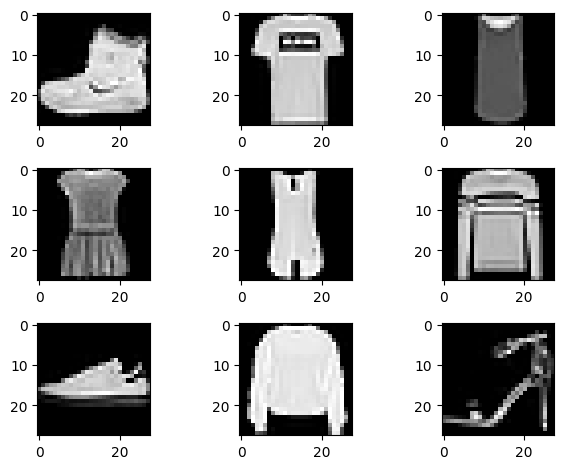

In [4]:
for i in range(9):
    plt.subplot(330+1+i)
    plt.imshow(train_data[i],cmap=plt.get_cmap('gray'))

plt.tight_layout()
plt.savefig('fashion_mnist.jpeg', dpi=300)

In [5]:
print(train_data.shape, test_data.shape)

train_data = train_data.reshape((train_data.shape[0], 28, 28, 1))
test_data = test_data.reshape((test_data.shape[0], 28, 28, 1))

print(train_data.shape, test_data.shape)

(60000, 28, 28) (10000, 28, 28)
(60000, 28, 28, 1) (10000, 28, 28, 1)


In [6]:
train_data = train_data/255.0
test_data = test_data/255.0

In [7]:
print(y.shape,y_test.shape)
print(y[:10])

(60000,) (10000,)
[9 0 0 3 0 2 7 2 5 5]


In [8]:
y = to_categorical(y)
y_test = to_categorical(y_test)

print(y.shape,y_test.shape)
y[:10]

(60000, 10) (10000, 10)


array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 1., 0., 0., 0., 0.]])

In [9]:
x_train,x_val,y_train,y_val = train_test_split(train_data,y,test_size=VAL_SIZE,random_state=RANDOM_STATE)

x_train.shape,x_val.shape,y_train.shape,y_val.shape

((48000, 28, 28, 1), (12000, 28, 28, 1), (48000, 10), (12000, 10))

# การ TRAIN MODEL ด้วย FASHION-MNIST DATASET

In [ ]:
#model = sequential()
model = tf.keras.Sequential()

#1.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same',input_shape=(28,28,1)))
model.add(tf.keras.layers.Activation('relu'))

#2.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same'))
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#3.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(tf.keras.layers.Activation('relu'))

#4.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#FULLY CONNECTES LAYER
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256))
model.add(tf.keras.layers.Activation('relu'))

#OUTPUT LAYER
model.add(tf.keras.layers.Dense(10,activation='softmax'))

In [ ]:
optimizer = Adam()
model.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)                   │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 28, 28, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 14, 14, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_14 (Activation)           │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 14, 14, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_15 (Activation)           │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 3136)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 256)                 │         803,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_16 (Activation)           │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 870,634 (3.32 MB)

 Trainable params: 870,634 (3.32 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
NO_EPOCH = 10

history = model.fit(x_train,y_train,batch_size=BATCH_SIZE,epochs=NO_EPOCH,verbose=1,validation_data=(x_val,y_val))

Epoch 1/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - accuracy: 0.6921 - loss: 0.8608 - val_accuracy: 0.8774 - val_loss: 0.3436
Epoch 2/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.8875 - loss: 0.3223 - val_accuracy: 0.8955 - val_loss: 0.2811
Epoch 3/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9076 - loss: 0.2547 - val_accuracy: 0.8984 - val_loss: 0.2808
Epoch 4/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9226 - loss: 0.2176 - val_accuracy: 0.9090 - val_loss: 0.2561
Epoch 5/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.9317 - loss: 0.1885 - val_accuracy: 0.9121 - val_loss: 0.2391
Epoch 6/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.9394 - loss: 0.1666 - val_accuracy: 0.9217 - val_loss: 0.2227
Epoch 7/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - accuracy: 0.9460 - loss: 0.1497 - val_accuracy: 0.9207 - val_loss: 0.2250
Epoch 8/10
188/188 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - accuracy: 0.9537 - loss: 0.1262 - val_acc

In [49]:
def create_trace(x,y,ylabel,color):
  # trace = go.Scatter(x=x, y=y, name=ylabel, marker=dict(color=color), mode='markers+lines', text=x)
  trace = go.Scatter(x=list(x), y=y, name=ylabel, marker=dict(color=color), mode='markers+lines', text=list(x))
  return trace

def plot_accuracy_and_loss(train_model):
  hist = train_model.history
  acc = hist['accuracy']
  val_acc = hist['val_accuracy']
  loss = hist['loss']
  val_loss = hist['val_loss']
  epochs = range(1,len(acc)+1)

  trace_ta = create_trace(epochs,acc,'Training Accuracy','green')
  trace_ts = create_trace(epochs,val_acc,'Validation Accuracy','red')
  trace_tl = create_trace(epochs,loss,'Training Loss','blue')
  trace_vl = create_trace(epochs,val_loss,'Validation Loss','magenta')

  fig = subplots.make_subplots(rows=1,cols=2,subplot_titles=('Training and Validation Accuracy','Training and Validation Loss'))
  fig.append_trace(trace_ta,1,1)
  fig.append_trace(trace_ts,1,1)
  fig.append_trace(trace_tl,1,2)
  fig.append_trace(trace_vl,1,2)
  fig['layout']['xaxis'].update(title='Epoch')
  fig['layout']['xaxis2'].update(title='Epoch')
  fig['layout']['yaxis'].update(title='Accuracy',range=[0,1])
  fig['layout']['yaxis2'].update(title='Loss',range=[0,1])

  plotly.offline.iplot(fig,filename='accuracy-loss')

In [ ]:
plot_accuracy_and_loss(history)

In [ ]:
score = model.evaluate(test_data,y_test,verbose=0)
print('Test loss:',score[0])
print('Test accuracy:',score[1])

Test loss: 0.2486833781003952
Test accuracy: 0.9200000166893005


# ทดลองแก้ปัญหา OVERFITTING ของ NEURAL NETWORK ด้วยเทคนิค IMAGE AGUMENTATION

## เตรียมภาพสำหรับทำ IMAGE AGUMENTATION

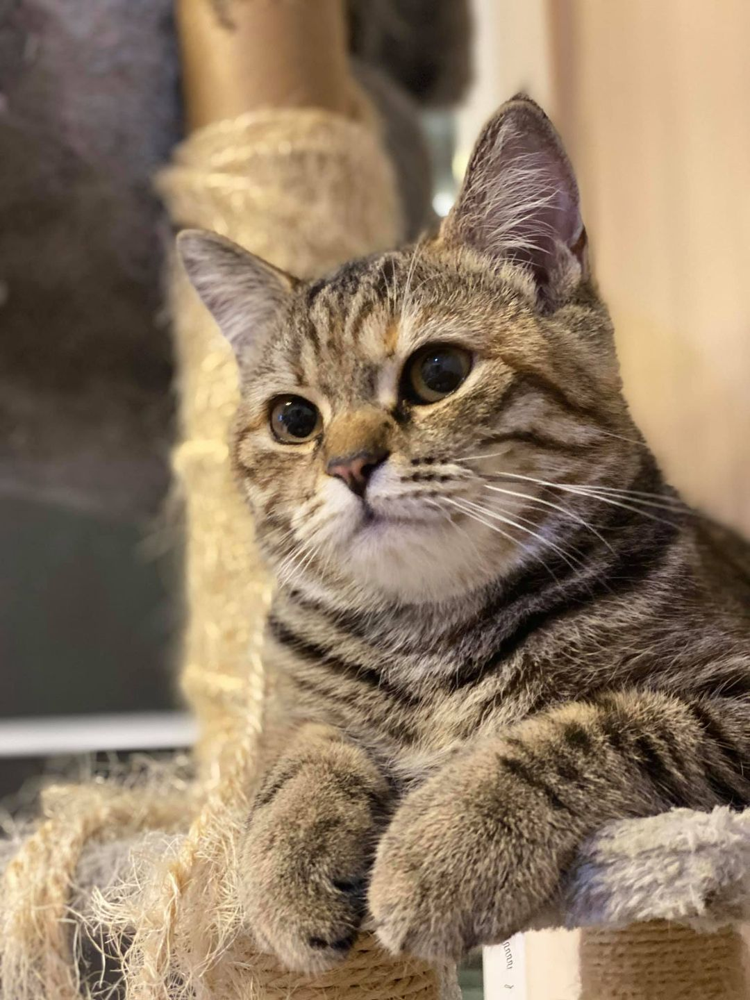

In [26]:
cat = load_img('cat.jpg')
cat

In [27]:
cat = img_to_array(cat)
print(cat.shape)
cat = cat.reshape(1,cat.shape[0],cat.shape[1],cat.shape[2])
print(cat.shape)

(1440, 1080, 3)
(1, 1440, 1080, 3)


## ทำ IMAGE AGUMENTATION ด้วยการ VERTICAL SHIFT

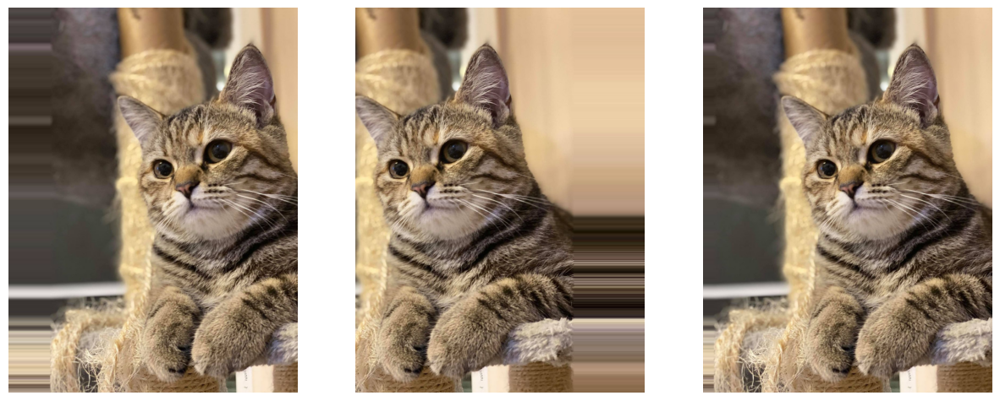

In [28]:
datagen = ImageDataGenerator(height_shift_range=0.2)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat1.jpg',dpi=300)

## ทดลองทำ IMAGE AGUMENTATION ด้วยการ ็HORIZONTAL SHIFT

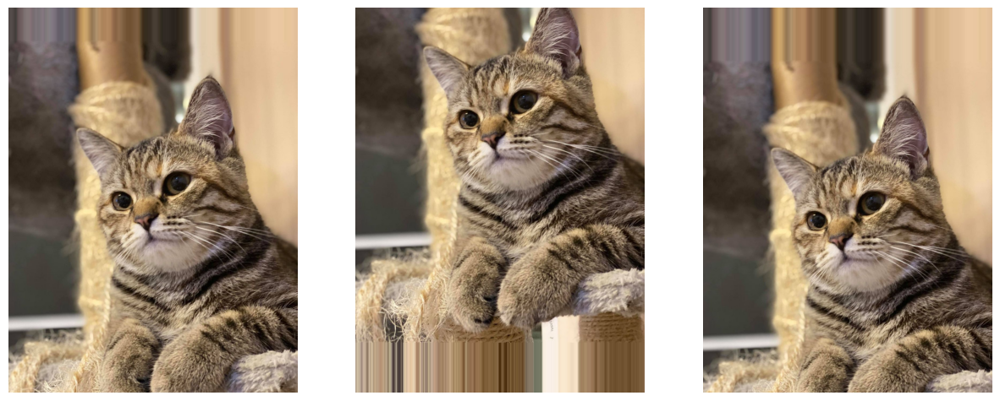

In [29]:
datagen = ImageDataGenerator(width_shift_range=0.2)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat2.jpg',dpi=300)

## ทดลองทำ IMAGE AUGMENTATION ด้วยการ SHEAR

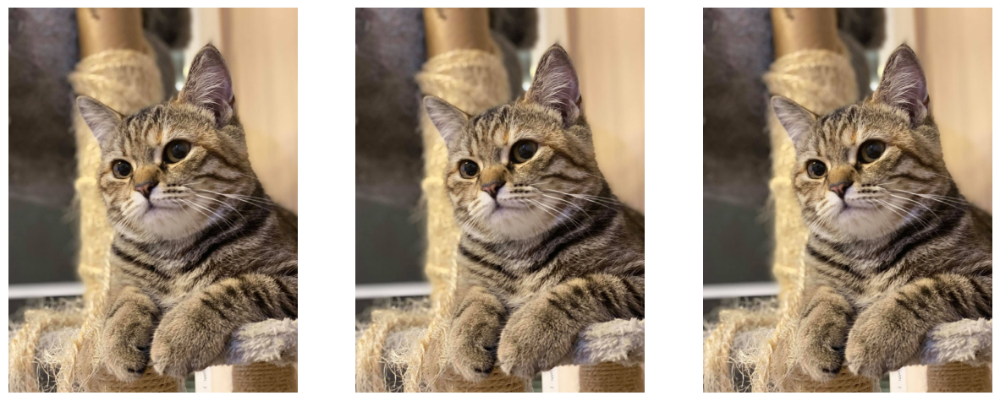

In [30]:
datagen = ImageDataGenerator(shear_range=0.2)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat3.jpg',dpi=300)

## ทดลองทำ IMAGE AUGMENTATION ด้วยการ ZOOM

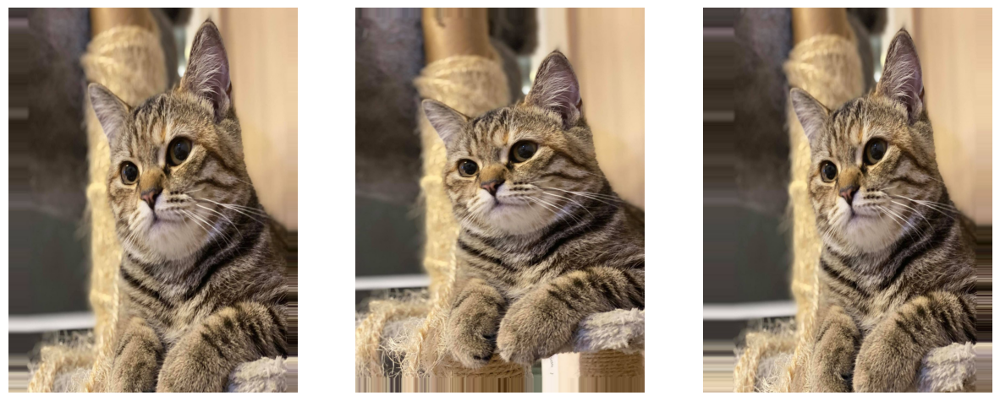

In [31]:
datagen = ImageDataGenerator(zoom_range=0.2)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat4.jpg',dpi=300)

## ทดลองทำ IMAGE AUGMENTATION ด้วยการ VERTICAL FLIP

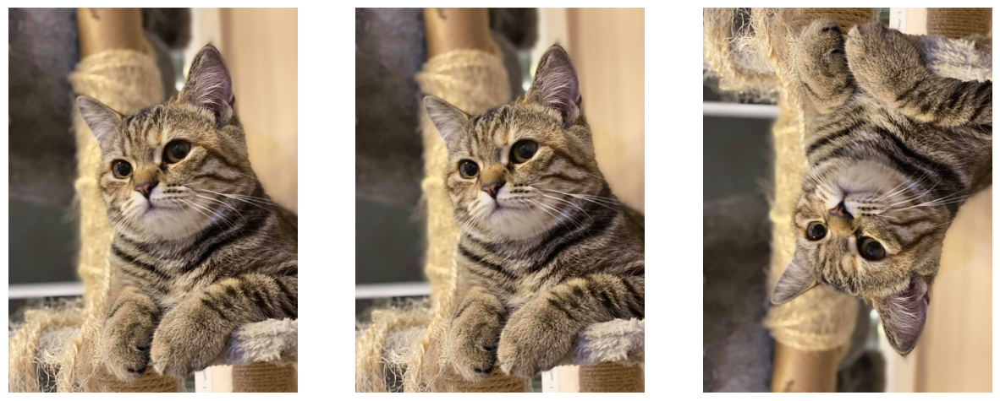

In [32]:
datagen = ImageDataGenerator(vertical_flip=True)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat5.jpg',dpi=300)

## ทดลองทำ IMAGE AUGMENTATION ด้วยการ HORIZONTAL FLIP

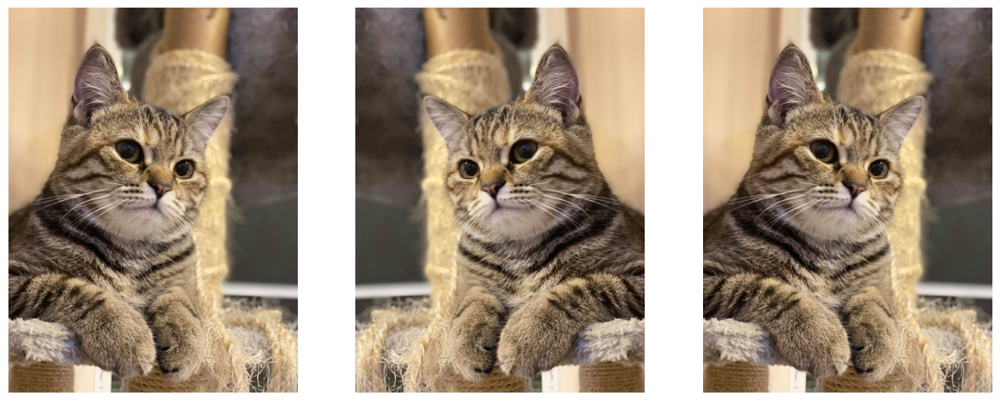

In [33]:
datagen = ImageDataGenerator(horizontal_flip=True)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat6.jpg',dpi=300)

## ทดลองทำ IMAGE AUGMENTATION ด้วยการ ROTATE

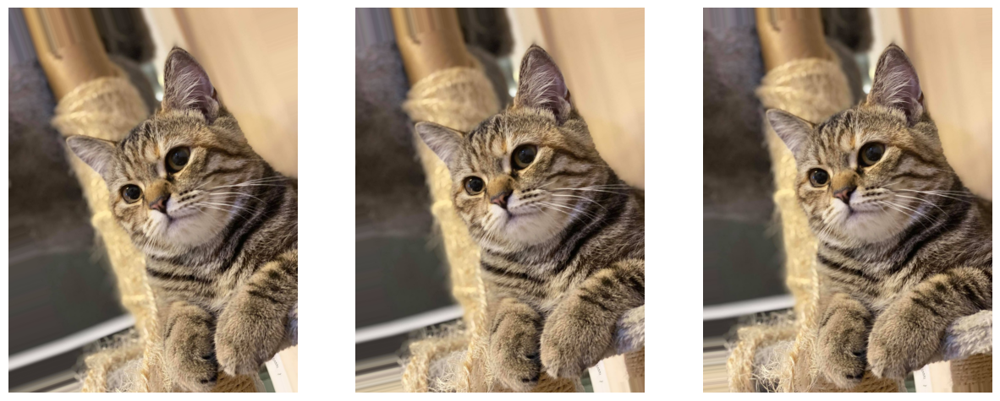

In [34]:
datagen = ImageDataGenerator(rotation_range=30)
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat7.jpg',dpi=300)

## ทดลองทำ IMAGE AUGMENTATION ด้วยการ FILL MODE

FILL MODE แบบ CONSTANT VALUES

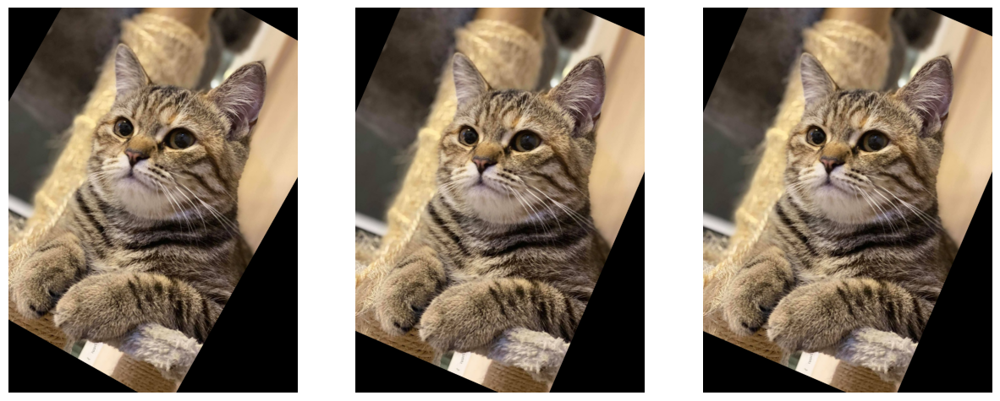

In [35]:
datagen = ImageDataGenerator(rotation_range=30,fill_mode='constant')
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat8.jpg',dpi=300)

FILL MODE แบบ NEAREST NEIGHBOR

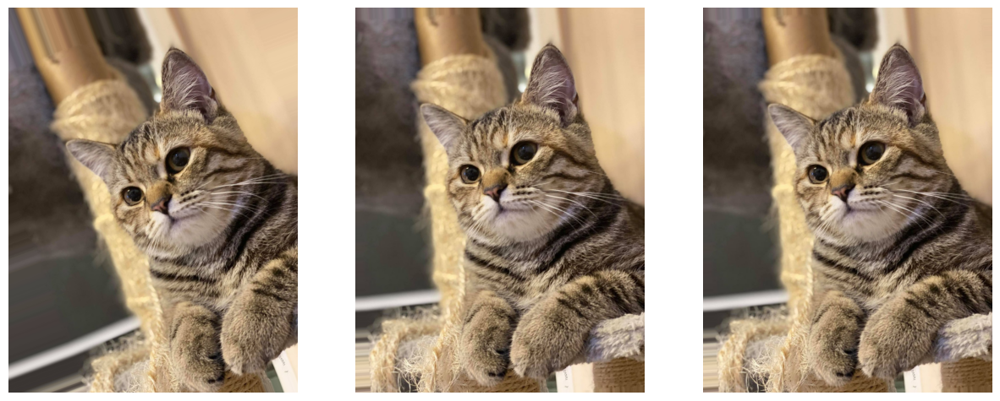

In [36]:
datagen = ImageDataGenerator(rotation_range=30,fill_mode='nearest')
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat9.jpg',dpi=300)

FILL MODE แบบ REFLEC VALUES

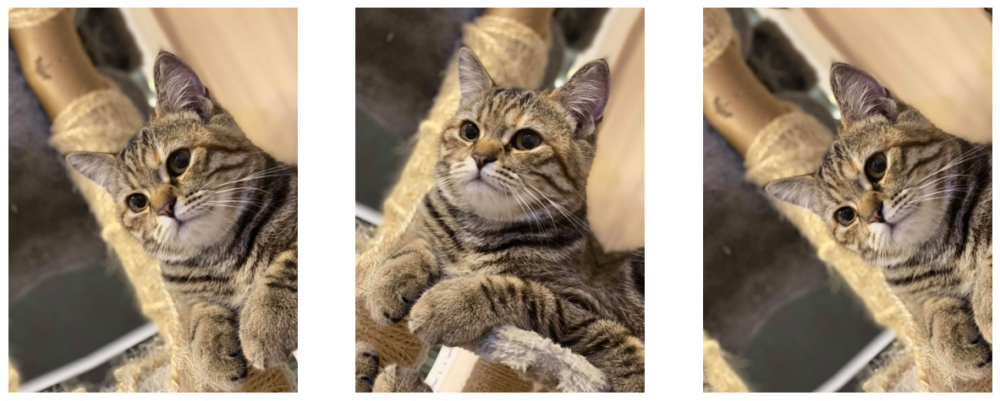

In [37]:
datagen = ImageDataGenerator(rotation_range=50,fill_mode='reflect')
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat10.jpg',dpi=300)

FILL MODE แบบ WRAP VALUES

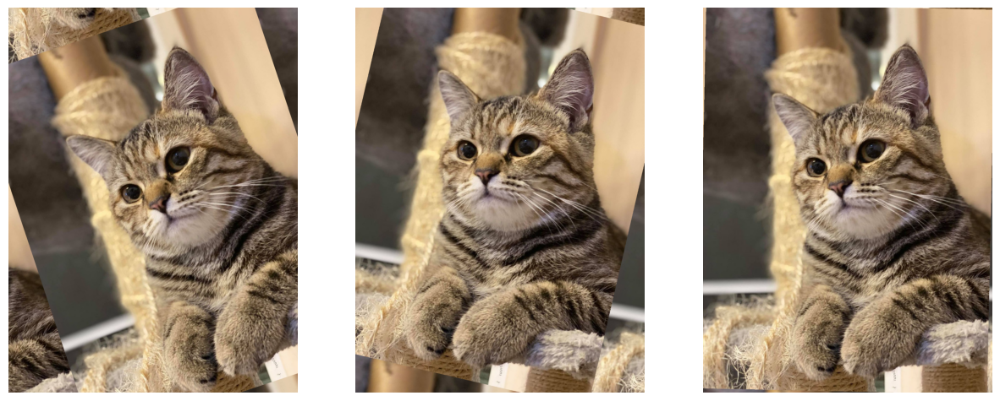

In [38]:
datagen = ImageDataGenerator(rotation_range=30,fill_mode='wrap')
aug_iter  = datagen.flow(cat,batch_size=1)
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(15,15))
for i in range(3):
  image = next(aug_iter)[0].astype('uint8')
  ax[i].imshow(image)
  ax[i].axis('off')

fig.savefig('cat11.jpg',dpi=300)

# การ TRAIN MODEL ด้วย FASHION-MNIST IMAGE AUGMENTATION

In [39]:
datagen = ImageDataGenerator(
    rotation_range=0.05,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.05
)
datagen.fit(x_train)

In [41]:
x_batch = datagen.flow(x_train,y_train,batch_size=9).__next__()
x_batch[0].shape

(9, 28, 28, 1)

In [42]:
x_batch = x_batch[0].reshape((x_batch[0].shape[0],28,28))
x_batch.shape

(9, 28, 28)

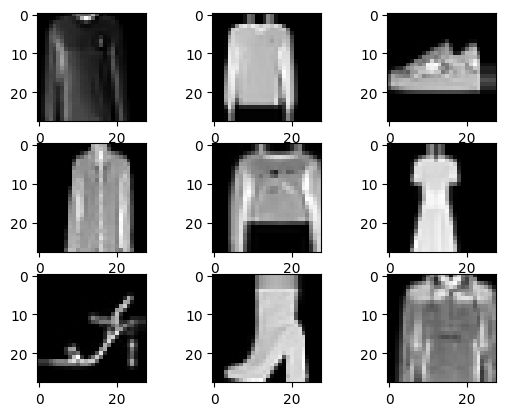

In [44]:
for i in range(0,9):
  plt.subplot(330+1+i)
  plt.imshow(x_batch[i],cmap=plt.get_cmap('gray'))

plt.savefig('fashion_mnist2.jpeg', dpi=300)

In [45]:
#model = sequential()
model = tf.keras.Sequential()

#1.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same',input_shape=(28,28,1)))
model.add(tf.keras.layers.Activation('relu'))

#2.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same'))
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#3.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(tf.keras.layers.Activation('relu'))

#4.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#FULLY CONNECTES LAYER
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256))
model.add(tf.keras.layers.Activation('relu'))

#OUTPUT LAYER
model.add(tf.keras.layers.Dense(10,activation='softmax'))

In [46]:
optimizer = Adam()
model.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 28, 28, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 14, 14, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 14, 14, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 3136)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │         803,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 870,634 (3.32 MB)

 Trainable params: 870,634 (3.32 MB)

 Non-trainable params: 0 (0.00 B)

In [47]:
NO_EPOCH = 50

history = model.fit(datagen.flow(x_train,y_train,batch_size=BATCH_SIZE),shuffle=True,epochs=NO_EPOCH,verbose=1,validation_data=(x_val,y_val),steps_per_epoch=x_train.shape[0] // BATCH_SIZE)

Epoch 1/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 24s 95ms/step - accuracy: 0.6212 - loss: 1.0314 - val_accuracy: 0.8066 - val_loss: 0.4996
Epoch 2/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7930 - loss: 0.5719 - val_accuracy: 0.8298 - val_loss: 0.4576
Epoch 3/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 35s 89ms/step - accuracy: 0.8068 - loss: 0.5056 - val_accuracy: 0.8537 - val_loss: 0.3825
Epoch 4/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8477 - loss: 0.4183 - val_accuracy: 0.8581 - val_loss: 0.3779
Epoch 5/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 20s 93ms/step - accuracy: 0.8370 - loss: 0.4333 - val_accuracy: 0.8808 - val_loss: 0.3206
Epoch 6/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8398 - loss: 0.4189 - val_accuracy: 0.8813 - val_loss: 0.3186
Epoch 7/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - accuracy: 0.8544 - loss: 0.3833 - val_accuracy: 0.8922 - val_loss: 0.2923
Epoch 8/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.8672 - loss: 0.3832 - val_ac

In [50]:
plot_accuracy_and_loss(history)

In [51]:
score = model.evaluate(test_data,y_test,verbose=0)
print('Test loss:',score[0])
print('Test accuracy:',score[1])

Test loss: 0.23154878616333008
Test accuracy: 0.9157999753952026


#  ทดลองแก้ปัญหา OVERFITTING ของ NEURAL NETWORK ด้วยเทคนิค BATCH NORMALIZATION

ทดลองทำ BATCH NORMALIZATION

In [55]:
datagen = ImageDataGenerator(
    rotation_range=0.05,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.05
)

datagen.fit(x_train)

In [56]:
#model = sequential()
model = tf.keras.Sequential()

#1.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same',input_shape=(28,28,1)))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))

#2.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same'))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#3.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))

#4.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))

#FULLY CONNECTES LAYER
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))

#OUTPUT LAYER
model.add(tf.keras.layers.Dense(10,activation='softmax'))

In [57]:
optimizer = Adam()
model.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 28, 28, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 28, 28, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 28, 28, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 14, 14, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 14, 14, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 14, 14, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 14, 14, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 3136)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         803,072 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           2,5

 Total params: 872,426 (3.33 MB)

 Trainable params: 871,530 (3.32 MB)

 Non-trainable params: 896 (3.50 KB)

In [58]:
NO_EPOCH = 50

history = model.fit(datagen.flow(x_train,y_train,batch_size=BATCH_SIZE),shuffle=True,epochs=NO_EPOCH,verbose=1,validation_data=(x_val,y_val),steps_per_epoch=x_train.shape[0] // BATCH_SIZE)

Epoch 1/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 26s 105ms/step - accuracy: 0.7378 - loss: 0.7214 - val_accuracy: 0.2136 - val_loss: 3.1432
Epoch 2/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8164 - loss: 0.4451 - val_accuracy: 0.2182 - val_loss: 3.1286
Epoch 3/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 35s 94ms/step - accuracy: 0.8530 - loss: 0.3908 - val_accuracy: 0.5149 - val_loss: 1.9711
Epoch 4/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8281 - loss: 0.3577 - val_accuracy: 0.5330 - val_loss: 1.9128
Epoch 5/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 17s 85ms/step - accuracy: 0.8770 - loss: 0.3304 - val_accuracy: 0.8653 - val_loss: 0.3702
Epoch 6/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8789 - loss: 0.3649 - val_accuracy: 0.8677 - val_loss: 0.3616
Epoch 7/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 19s 84ms/step - accuracy: 0.8843 - loss: 0.3097 - val_accuracy: 0.8848 - val_loss: 0.3023
Epoch 8/50
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8945 - loss: 0.2589 - val_acc

In [59]:
plot_accuracy_and_loss(history)

In [60]:
score = model.evaluate(test_data,y_test,verbose=0)
print('Test loss:',score[0])
print('Test accuracy:',score[1])

Test loss: 0.320311576128006
Test accuracy: 0.8964999914169312


# ทดลองแก้ปัญหา OVERFITTING ของ NEURAL NETWORK ด้วยเทคนิค DROPOUT

ทดลองทำ DROPOUT

In [62]:
datagen = ImageDataGenerator(
    rotation_range=0.05,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.05
)

datagen.fit(x_train)

In [63]:
#model = sequential()
model = tf.keras.Sequential()

#1.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same',input_shape=(28,28,1)))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.Dropout(0.3))

#2.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='Same'))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))
model.add(tf.keras.layers.Dropout(0.3))

#3.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.Dropout(0.3))

#4.CNN LAYER
model.add(tf.keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='Same'))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.MaxPooling2D(pool_size=(2,2)))
model.add(tf.keras.layers.Dropout(0.3))

#FULLY CONNECTES LAYER
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(256))
model.add(BatchNormalization())
model.add(tf.keras.layers.Activation('relu'))
model.add(tf.keras.layers.Dropout(0.3))

#OUTPUT LAYER
model.add(tf.keras.layers.Dense(10,activation='softmax'))

In [64]:
optimizer = Adam()
model.compile(optimizer=optimizer,loss='categorical_crossentropy',metrics=['accuracy'])

model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)                    │ (None, 28, 28, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 28, 28, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 28, 28, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 28, 28, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 28, 28, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 14, 14, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 14, 14, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 14, 14, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_12 (Conv2D)                   │ (None, 14, 14, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 14, 14, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 7, 7, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 3136)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 872,426 (3.33 MB)

 Trainable params: 871,530 (3.32 MB)

 Non-trainable params: 896 (3.50 KB)

In [67]:
NO_EPOCH = 200
history = model.fit(datagen.flow(x_train,y_train,batch_size=BATCH_SIZE),shuffle=True,epochs=NO_EPOCH,verbose=1,validation_data=(x_val,y_val),steps_per_epoch=x_train.shape[0] // BATCH_SIZE)

Epoch 1/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 32s 116ms/step - accuracy: 0.5986 - loss: 1.1091 - val_accuracy: 0.1947 - val_loss: 3.3721
Epoch 2/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7383 - loss: 0.6978 - val_accuracy: 0.2045 - val_loss: 3.3394
Epoch 3/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 18s 96ms/step - accuracy: 0.7641 - loss: 0.6178 - val_accuracy: 0.4943 - val_loss: 1.7475
Epoch 4/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.8281 - loss: 0.5759 - val_accuracy: 0.4957 - val_loss: 1.7200
Epoch 5/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 17s 87ms/step - accuracy: 0.8070 - loss: 0.5166 - val_accuracy: 0.7954 - val_loss: 0.5497
Epoch 6/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8594 - loss: 0.4173 - val_accuracy: 0.7850 - val_loss: 0.5944
Epoch 7/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 20s 89ms/step - accuracy: 0.8251 - loss: 0.4605 - val_accuracy: 0.8390 - val_loss: 0.4602
Epoch 8/200
187/187 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8438 - loss: 0.4461 -

In [68]:
plot_accuracy_and_loss(history)

In [69]:
score = model.evaluate(test_data,y_test,verbose=0)
print('Test loss:',score[0])
print('Test accuracy:',score[1])

Test loss: 0.19007150828838348
Test accuracy: 0.9318000078201294
